# Servicio Social 2024b-2025a
## Análisis NLP
### Cohesión en un equipo de trabajo

- Ignacio David Vázquez Pérez
- 20182928
- Ingeniería en computación
- ADRIANA PENA PEREZ NEGRON

### Features
- Lematización y Estematización: Procesar el texto para reducir las palabras a su forma base o raíz.
- Lectura de Palabras en su Raíz Origen: Extraer y analizar las palabras en su forma original.
- Gráfica de Palabras: Visualizar las palabras más comunes y su frecuencia en gráficos.
- Histograma NLP: Crear histogramas para mostrar la distribución de palabras y frases.
- Análisis de Sentimiento por Cada Pregunta: Evaluar el sentimiento de las respuestas para cada pregunta.
- Word Embedding: Analizar la relación y similitud entre palabras utilizando técnicas de incrustación de palabras.
- Agrupar por Años de Experiencia: Identificar tendencias y cohesión en base a los años de experiencia de los encuestados.
- Agrupar por Empresas: Evaluar los sentimientos en preguntas neutrales y determinar las palabras más utilizadas por los empleados de diferentes empresas.

In [21]:
import pandas as pd
import docx
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from spacy.lang.es.stop_words import STOP_WORDS
import matplotlib.pyplot as plt
from itertools import combinations, islice
import spacy
from wordcloud import WordCloud
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
from textblob import TextBlob
import re


In [12]:
import spacy
from spacy.lang.es.stop_words import STOP_WORDS

nlp = spacy.load('es_core_news_sm')

In [13]:
class WordCloudGenerator:
    def __init__(self, df, text_columns):
        self.df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
        self.text_columns = text_columns

    def clean_text(self, text):
        # Remove common patterns (e.g., URLs, emails)
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
        text = re.sub(r'\S+@\S+', '', text, flags=re.MULTILINE)
        # Remove non-alphanumeric characters
        text = re.sub(r'\W', ' ', text)
        # Remove single characters
        text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text)
        # Remove multiple spaces
        text = re.sub(r'\s+', ' ', text, flags=re.I)
        # Convert to lowercase
        text = text.lower()
        return text

    def generate_word_cloud(self, text_data, column_name):
        # Remove stop words
        stop_words = set(STOP_WORDS)
        text_data = ' '.join([word for word in text_data.split() if word not in stop_words])
        # Generate word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
        # Display the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {column_name}')
        plt.show()

    def find_important_combinations(self, text_data, n):
        words = text_data.split()
        ngrams = zip(*[islice(words, i, None) for i in range(n)])
        ngram_counts = Counter(ngrams)
        most_common_ngrams = ngram_counts.most_common(3)
        return most_common_ngrams

    def run(self):
        for column in self.text_columns:
            text_data = ' '.join(self.df[column].apply(self.clean_text))
            self.generate_word_cloud(text_data, column)
            for n in range(1, 4):
                important_combinations = self.find_important_combinations(text_data, n)
                print(f'Most important {n}-word combinations for {column}: {important_combinations}')

In [56]:
import pandas as pd
import spacy
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from textblob import TextBlob
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

class NLPAnalysis:
    def __init__(self, df, column_names, remove_sentiment_stop_words=True):
        self.df = df
        self.column_names = column_names
        self.nlp = spacy.load('es_core_news_sm')
        self.remove_sentiment_stop_words = remove_sentiment_stop_words
        
    def run(self):
        for column_name in self.column_names:
            self.analyze_factors(column_name)

    def analyze_factors(self, column_name):
        all_factors = ' '.join(self.df[column_name])
        all_factors = self.lemmatize_text(all_factors)

        vectorizer = CountVectorizer(stop_words=list(spacy.lang.es.stop_words.STOP_WORDS), ngram_range=(2, 5))
        X = vectorizer.fit_transform([all_factors])
        word_counts = X.toarray().sum(axis=0)
        words = vectorizer.get_feature_names_out()
        common_words = dict(zip(words, word_counts))

        tfidf_vectorizer = TfidfVectorizer(stop_words=list(spacy.lang.es.stop_words.STOP_WORDS), ngram_range=(2, 5))
        X_tfidf = tfidf_vectorizer.fit_transform([all_factors])
        tfidf_scores = X_tfidf.toarray().sum(axis=0)
        tfidf_words = tfidf_vectorizer.get_feature_names_out()
        important_words = dict(zip(tfidf_words, tfidf_scores))

        common_words = {self.normalize_ngram(k): v for k, v in common_words.items() if self.normalize_ngram(k)}
        important_words = {self.normalize_ngram(k): v for k, v in important_words.items() if self.normalize_ngram(k)}
        combined_ngrams = {**common_words, **important_words}
        most_common_ngrams = Counter(combined_ngrams).most_common(10)
        common_factors = [word for word, count in most_common_ngrams]

        self.plot_common_words(most_common_ngrams, column_name)
        self.plot_wordcloud(all_factors, column_name)
        self.plot_histogram(all_factors, column_name)
        self.sentiment_analysis(column_name)
        self.word_embedding(all_factors, column_name)

    def lemmatize_text(self, text):
        doc = self.nlp(text)
        if self.remove_sentiment_stop_words:
            return ' '.join([token.lemma_ for token in doc if not token.is_stop])
        else:
            return ' '.join([token.lemma_ for token in doc])

    def normalize_ngram(self, ngram):
        words = ngram.split()
        lemmatized_words = [self.lemmatize_text(word) for word in words]
        if len(lemmatized_words) != len(set(lemmatized_words)):
            return None
        sorted_words = sorted(lemmatized_words)
        return ' '.join(sorted_words)

    def plot_common_words(self, most_common_words, column_name):
        common_words_df = pd.DataFrame(most_common_words, columns=['phrase', 'count'])
        plt.figure(figsize=(12, 6), dpi=600)
        plt.bar(common_words_df['phrase'], common_words_df['count'], color='skyblue')
        plt.xlabel('Phrases')
        plt.ylabel('Count')
        plt.title(f'Most Common Phrases in {column_name}')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    def plot_important_words(self, most_important_words, column_name):
        important_words_df = pd.DataFrame(most_important_words, columns=['phrase', 'score'])
        plt.figure(figsize=(12, 6), dpi=600)
        plt.bar(important_words_df['phrase'], important_words_df['score'], color='lightgreen')
        plt.xlabel('Phrases')
        plt.ylabel('TF-IDF Score')
        plt.title(f'Most Important Phrases in {column_name}')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

    def generate_word_cloud(self, text_data, column_name):
        stop_words = set(spacy.lang.es.stop_words.STOP_WORDS)
        words = [word for word in text_data.split() if word not in stop_words]
        lemmatized_words = [self.lemmatize_text(word) for word in words]
        unique_words = list(set(lemmatized_words))
        text_data = ' '.join(unique_words)
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {column_name}')
        plt.show()

    def find_important_combinations(self, text_data, n):
        words = text_data.split()
        ngrams = zip(*[islice(words, i, None) for i in range(n)])
        ngram_counts = Counter(ngrams)
        most_common_ngrams = ngram_counts.most_common(3)
        return most_common_ngrams
        
    def plot_wordcloud(self, all_factors, column_name):
        all_factors = self.clean_text(all_factors)
        self.generate_word_cloud(all_factors, column_name)
        for n in range(1, 4):
            important_combinations = self.find_important_combinations(all_factors, n)
            normalized_combinations = [self.normalize_ngram(' '.join(map(str, comb))) for comb in important_combinations]
            unique_combinations = list(filter(None, set(normalized_combinations)))
            print(f'Most important {n}-word combinations for {column_name}: {unique_combinations}')
        
    def clean_text(self, text):
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
        text = re.sub(r'\S+@\S+', '', text, flags=re.MULTILINE)
        text = re.sub(r'\W', ' ', text)
        text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text)
        text = re.sub(r'\s+', ' ', text, flags=re.I)
        text = text.lower()
        return text

    def plot_histogram(self, text, column_name):
        doc = self.nlp(text)
        words = [token.text for token in doc if not token.is_stop]
        word_freq = Counter(words)
        word_freq_df = pd.DataFrame(word_freq.items(), columns=['word', 'count'])
        plt.figure(figsize=(12, 6), dpi=300)
        sns.histplot(word_freq_df['count'], bins=30, kde=False, color='blue')
        plt.xlabel('Word Frequency')
        plt.ylabel('Count')
        plt.title(f'Word Frequency Histogram for {column_name}')
        plt.show()

    def sentiment_analysis(self, column_name):
        sentiments = self.df[column_name].apply(lambda x: TextBlob(x).sentiment.polarity)
        plt.figure(figsize=(12, 6), dpi=300)
        sns.histplot(sentiments, bins=30, kde=True, color='purple')
        plt.xlabel('Sentiment Polarity')
        plt.ylabel('Frequency')
        plt.title(f'Sentiment Analysis for {column_name}')
        plt.show()

    def word_embedding(self, text, column_name, save_plot=False, plot_path='word_embedding.png'):
        vectorizer = TfidfVectorizer(stop_words=list(spacy.lang.es.stop_words.STOP_WORDS))
        X = vectorizer.fit_transform([text])
        words = vectorizer.get_feature_names_out()
        word_vectors = X.toarray().T
        if word_vectors.shape[0] < 2 or word_vectors.shape[1] < 2:
            print(f"Not enough samples or features for word embedding in {column_name}")
            return

        pca = PCA(n_components=2)
        pca_result = pca.fit_transform(word_vectors)
        tsne = TSNE(n_components=2)
        tsne_result = tsne.fit_transform(word_vectors)
        umap_result = umap.UMAP(n_components=2).fit_transform(word_vectors)

        plt.figure(figsize=(18, 6), dpi=300)

        plt.subplot(1, 3, 1)
        plt.scatter(pca_result[:, 0], pca_result[:, 1], c='red', label='PCA')
        plt.xlabel('Component 1')
        plt.ylabel('Component 2')
        plt.title(f'PCA Word Embedding for {column_name}')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c='blue', label='t-SNE')
        plt.xlabel('Component 1')
        plt.ylabel('Component 2')
        plt.title(f't-SNE Word Embedding for {column_name}')
        plt.legend()

        plt.subplot(1, 3, 3)
        plt.scatter(umap_result[:, 0], umap_result[:, 1], c='green', label='UMAP')
        plt.xlabel('Component 1')
        plt.ylabel('Component 2')
        plt.title(f'UMAP Word Embedding for {column_name}')
        plt.legend()

        plt.suptitle(f'Word Embedding for {column_name}', fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])

        plt.show()

In [57]:
# Read a CSV file with headers set to True
df = pd.read_excel('/Users/mi19292/Documents/SERVICIO_SOCIAL/audios_escritos.xlsx', header=0)
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [58]:
df

,Nombre,¿Cuántos años de experiencia tienes en el desarrollo de software?,¿En qué empresa trabajas?,¿Cuál es tu puesto?,¿Cuál es para ti el significado de cohesión en un equipo de trabajo?,Cita alguna situación que creas refleje este tipo de cohesión,Hay algún incidente que recuerdes que refleja mala o poca cohesión
0,RAMSES EMMANUEL VAZQUEZ GALINDO,2,SIAC Software,Desarrollador Jr,"Que tenga sentido lo que estan haciendo, como ...","Al desarrollar o resolver algun bug, que traba...","Mas que nada en comunicacion, se pide una reso..."
1,JOSE ANTONIO CARDENAS CASTAÑEDA,2,SIAC,Desarrollador Jr,"Cada quien tenga su rol asignado, el trabajo e...",En mi trabajo usamos ciertas herramientas para...,La falta de comunicacion y organizacion en la ...
2,ALEJANDRO CHAVEZ GOMEZ,3,IBM,Desarrollador de Software,Que todas las partes del equipo sepan lo que h...,Nos toco tener una entrega en la que nos toco ...,Si las personas no entendian que el trabajo de...
3,ANDRE RAFAEL LOZA ARECHIGA,3.5,Oracle,Desarrollador de Software,Que hay un buen trabajo en equipo.,Resolver bugs sobre todo cuando tenemos un bug...,Es que dos cambios en el mismo archivo nos cau...
4,DAVID CANTO CRUZ,3,Delaney,Desarrollador,El trabajar en equipo.,Cuando sale un imprevisto y tenemos que coordi...,Una vez la persona encargada no estuvo en cont...
...,...,...,...,...,...,...,...
71,ULISES OLDEMAR ORTEGA GUTIERREZ,3,UDG,Ingeniero en soporte,Que tengan un buen flujo de trabajo,En una cuestión a resolver en desarrollo es im...,"No, ninguno"
72,BRYAN DANIEL NUÑEZ ALVARADO,5,Almidones Mexicanos,Ingeniero en infraestructura,Que todos tengan el mismo rumbo y compartan el...,En una ocasión a falta de Internet en toda la ...,No se me ocurre
73,ELIUD ALEJANDRO MUÑOZ ESTUPIÑAN,2,IBM,Aplication Developer,Pues es muy relevante,En cuestiones críticas para algún cliente pred...,Problemas respecto a la delegación de responsa...
74,MARIANA JIMENEZ GARCIA,4,Comercializadora tumarketmx,Administrativo,Es importante la comunicación entre un equipo ...,Durante el trabajo en el área administrativa j...,por falta de acuerdo y por falta de informació...


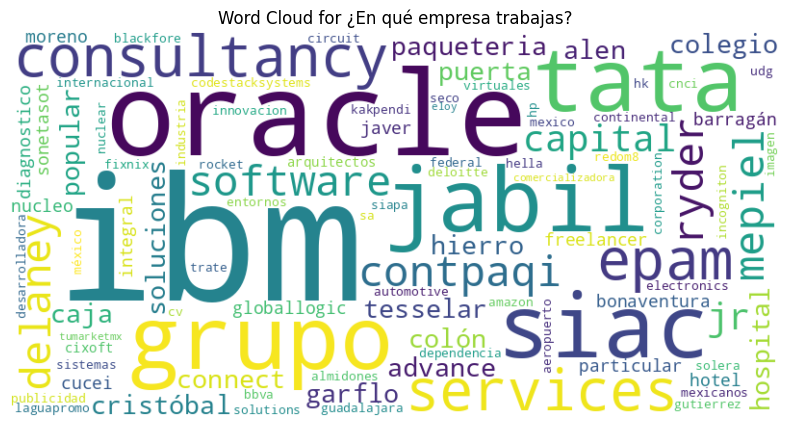

Most important 1-word combinations for ¿En qué empresa trabajas?: [(('ibm',), 11), (('de',), 6), (('oracle',), 4)]
Most important 2-word combinations for ¿En qué empresa trabajas?: [(('tata', 'consultancy'), 2), (('consultancy', 'services'), 2), (('siac', 'software'), 1)]
Most important 3-word combinations for ¿En qué empresa trabajas?: [(('tata', 'consultancy', 'services'), 2), (('siac', 'software', 'siac'), 1), (('software', 'siac', 'ibm'), 1)]


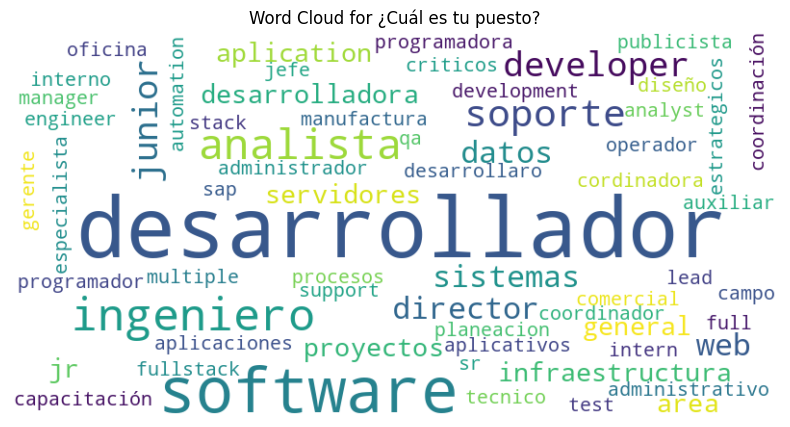

Most important 1-word combinations for ¿Cuál es tu puesto?: [(('desarrollador',), 32), (('de',), 29), (('software',), 16)]
Most important 2-word combinations for ¿Cuál es tu puesto?: [(('desarrollador', 'de'), 14), (('de', 'software'), 14), (('software', 'desarrollador'), 8)]
Most important 3-word combinations for ¿Cuál es tu puesto?: [(('desarrollador', 'de', 'software'), 12), (('de', 'software', 'desarrollador'), 7), (('software', 'desarrollador', 'de'), 5)]


In [24]:
nlp_analysis = WordCloudGenerator(df, ['¿En qué empresa trabajas?', '¿Cuál es tu puesto?'])
nlp_analysis.run()

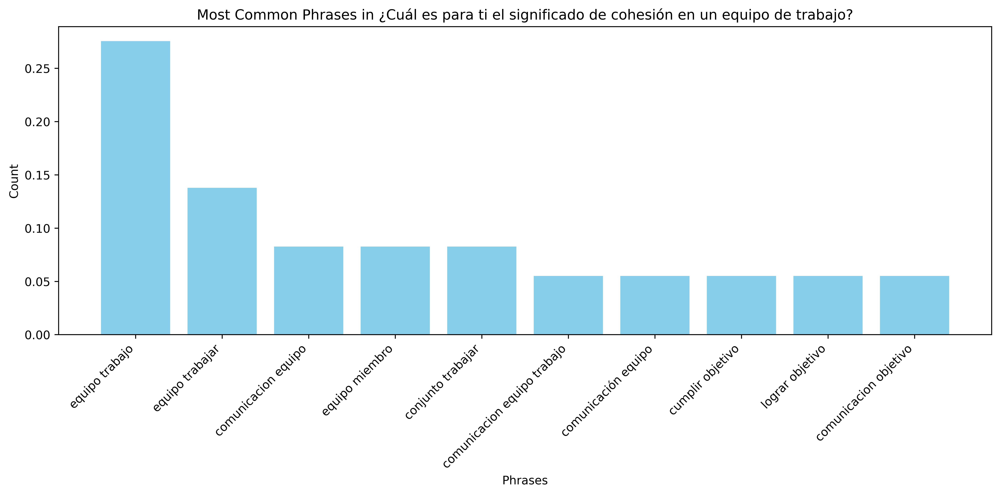

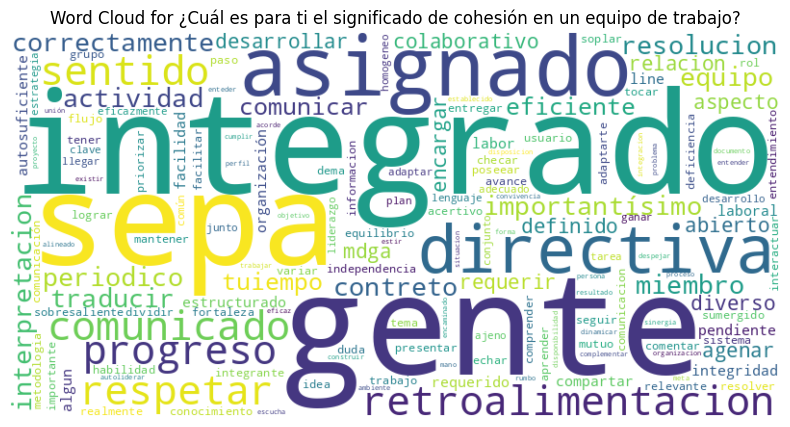

Most important 1-word combinations for ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?: ["( ' trabajo ' , ) 15", "( ' trabajar ' , ) 15", "( ' equipo ' , ) 30"]
Most important 2-word combinations for ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?: ["' equipo ' ) ( ' trabajar ' , 5", "' equipo ' ) ( ' trabajo ' , 10", "' equipo ' ) ( ' miembro ' , 3"]
Most important 3-word combinations for ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?: ["' ' ) ' entender ' , ( ' ganar ' , 1", "' entender ' ) ' ganar ' , ( ' sentido ' , 1", "' comunicacion ' ) ' equipo ' , ( ' trabajo ' , 2"]


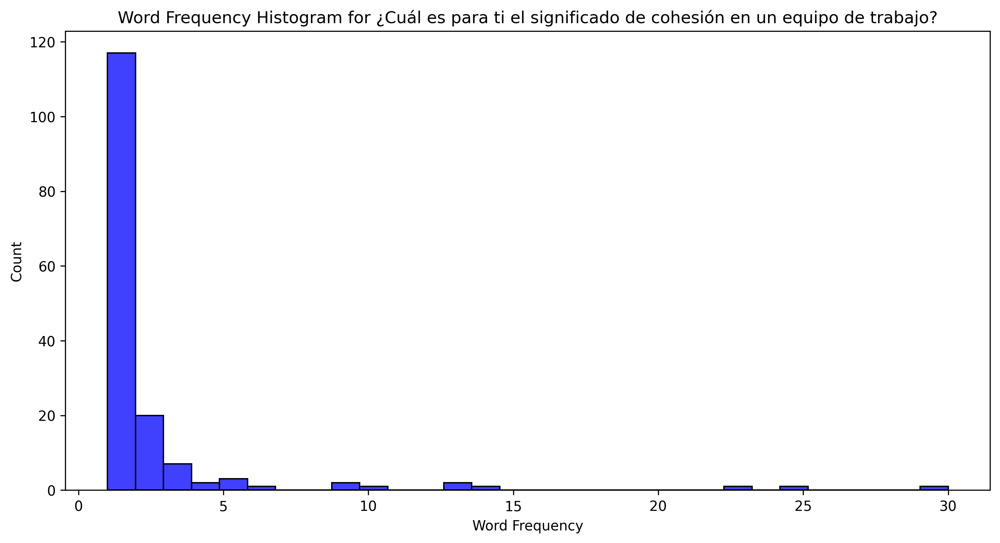

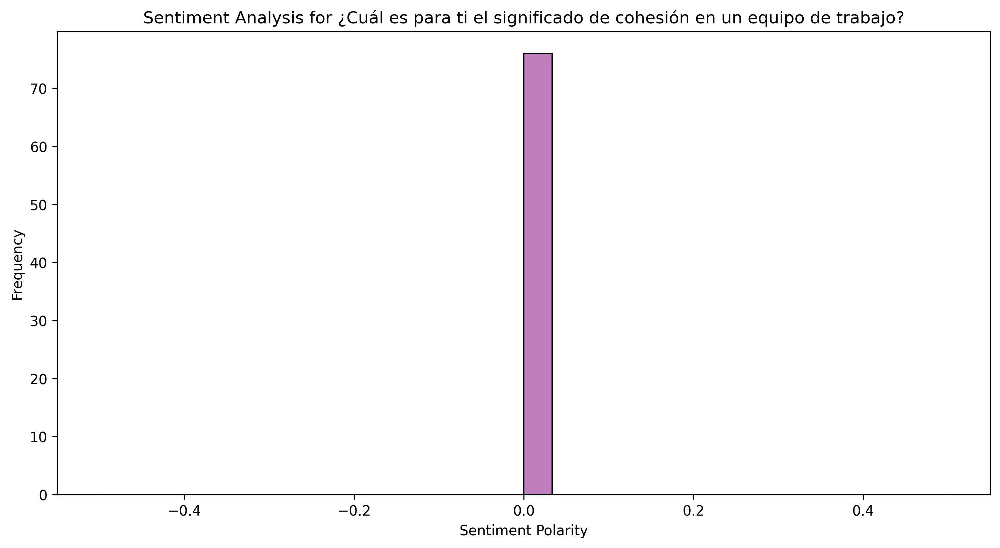

Not enough samples or features for word embedding in ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?


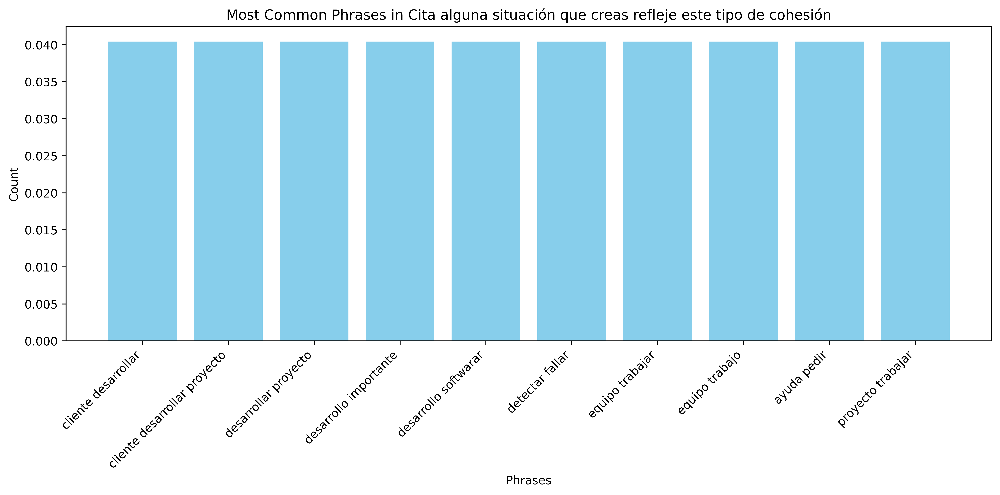

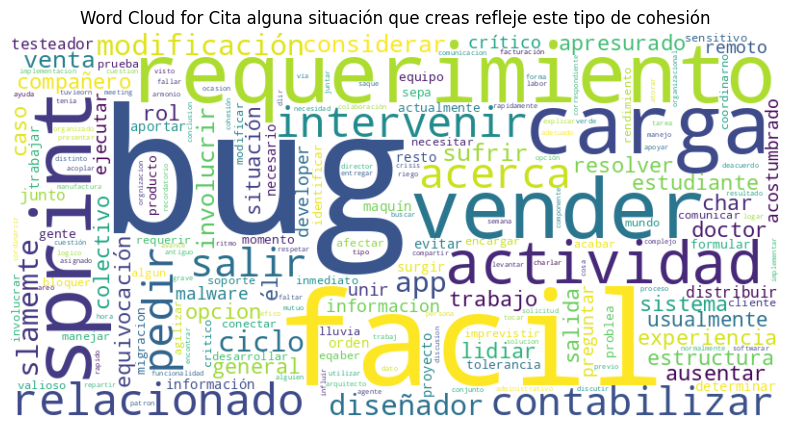

Most important 1-word combinations for Cita alguna situación que creas refleje este tipo de cohesión: ["( ' equipo ' , ) 16", "( ' ' , ) 25", "( ' proyecto ' , ) 19"]
Most important 2-word combinations for Cita alguna situación que creas refleje este tipo de cohesión: ["' fallar ' ) ( ' detectar ' , 2", "' ' ) ( ' solucionar ' , 4", "' proyecto ' ) ( ' tocar ' , 2"]
Most important 3-word combinations for Cita alguna situación que creas refleje este tipo de cohesión: ["' desarrollar ' , ' proyecto ' ) ( ' cliente ' , 2", "' algun ' ) ' resolver ' , ( ' desarrollar ' , 1", "' ' , ' deacuerdo ' ) ( ' ' , 2"]


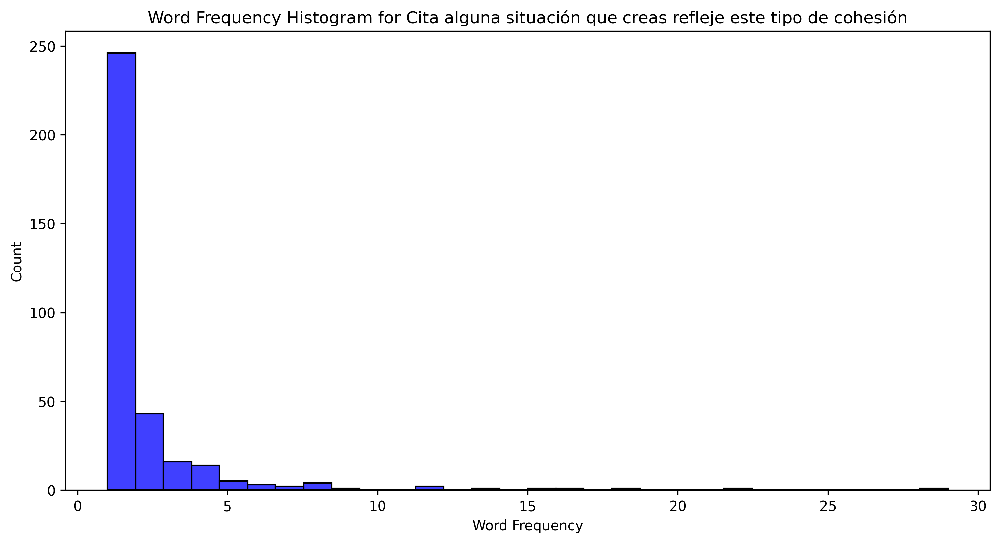

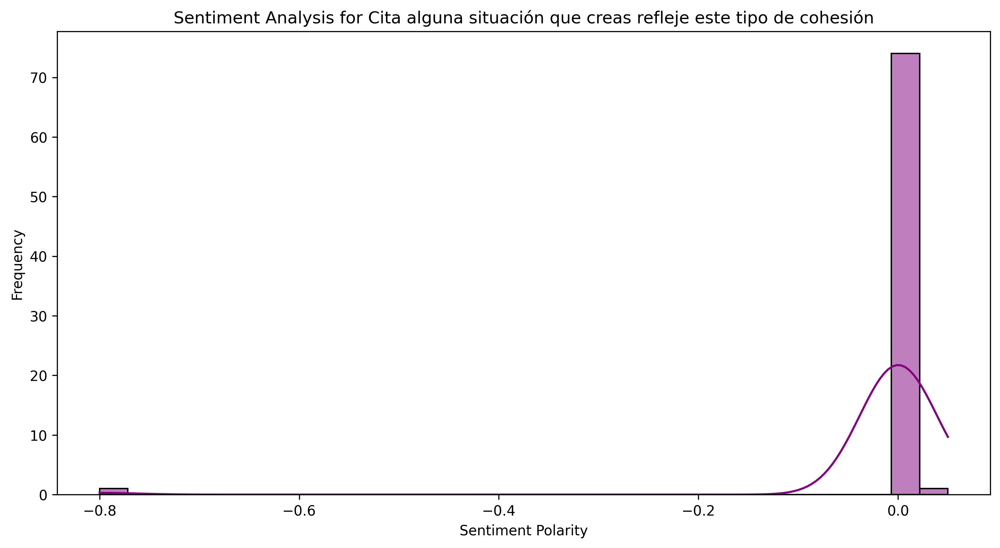

Not enough samples or features for word embedding in Cita alguna situación que creas refleje este tipo de cohesión


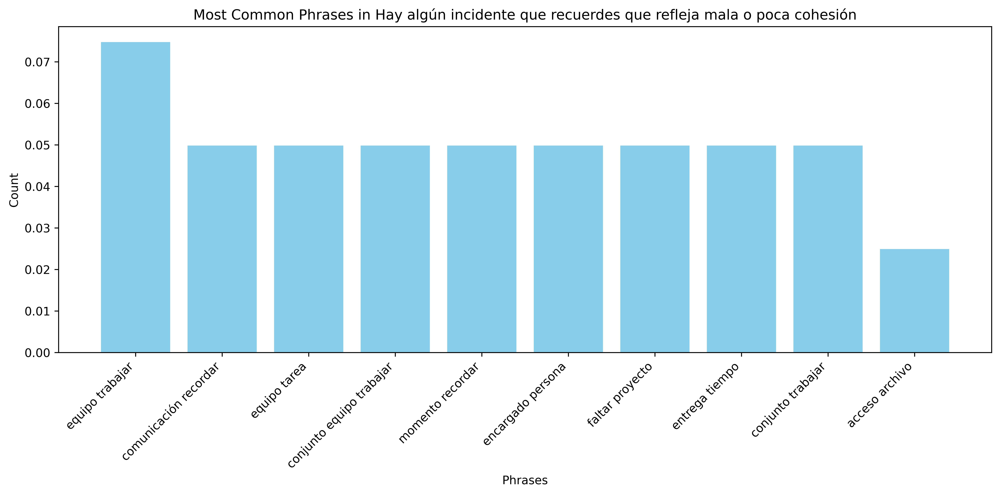

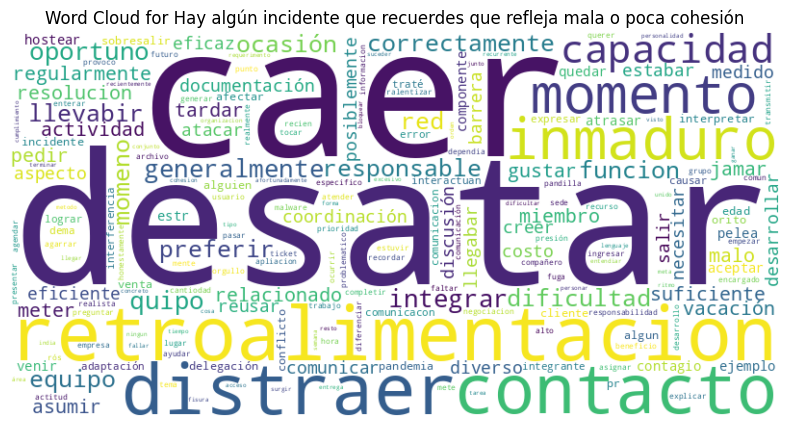

Most important 1-word combinations for Hay algún incidente que recuerdes que refleja mala o poca cohesión: ["( ' comunicacion ' , ) 10", "( ' falta ' , ) 14", "( ' equipo ' , ) 14"]
Most important 2-word combinations for Hay algún incidente que recuerdes que refleja mala o poca cohesión: ["' comunicacion ' ) ( ' falta ' , 8", "' encargar ' ) ( ' persona ' , 2", "' equipo ' ) ( ' trabajar ' , 3"]
Most important 3-word combinations for Hay algún incidente que recuerdes que refleja mala o poca cohesión: ["' conjunto ' ) ' trabajar ' , ( ' equipo ' , 2", "' explicar ' ) ' resolucion ' , ( ' pedir ' , 1", "' pedir ' , ' resolucion ' ) ( ' comunicacion ' , 1"]


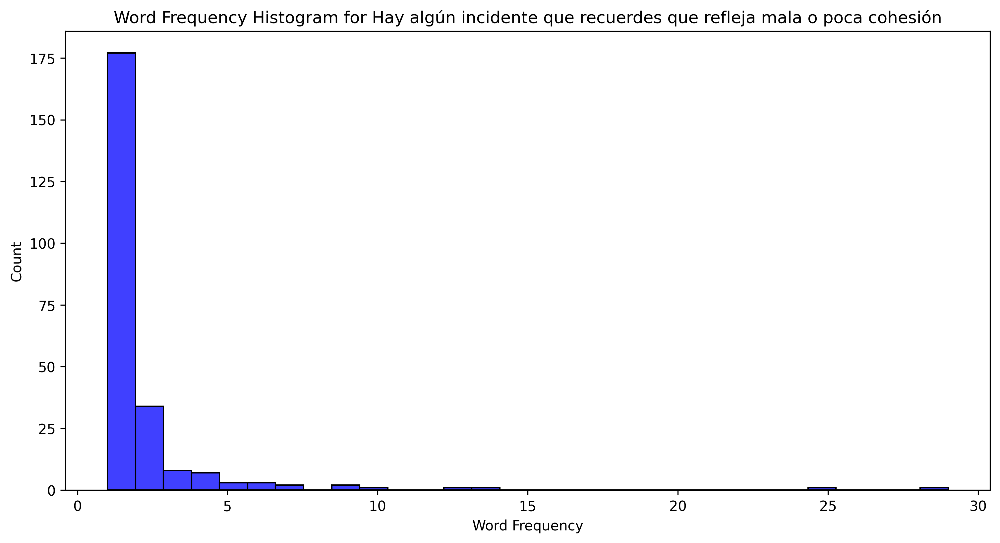

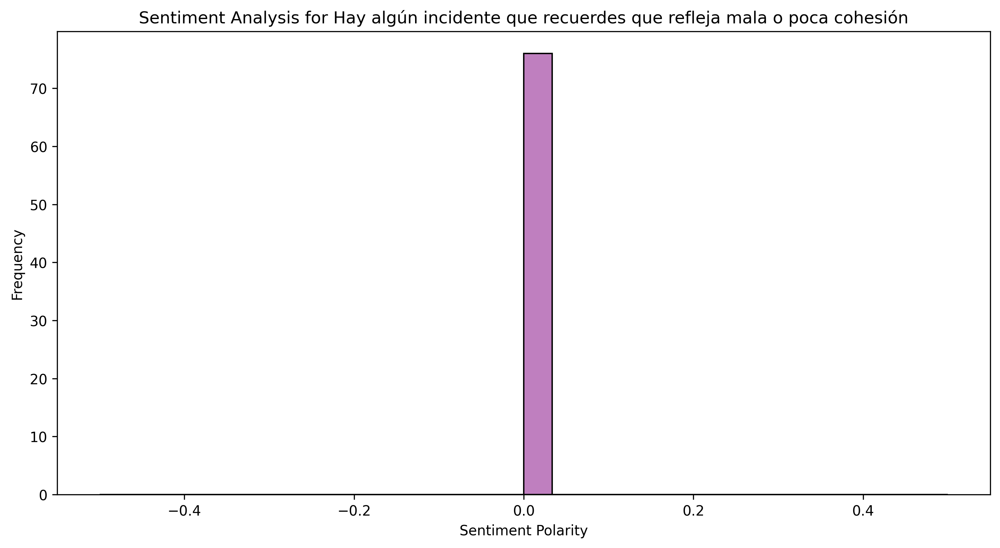

Not enough samples or features for word embedding in Hay algún incidente que recuerdes que refleja mala o poca cohesión


In [59]:
column_names = df.columns[-3:].tolist()
nlp_analysis = NLPAnalysis(df, column_names)
nlp_analysis.run()

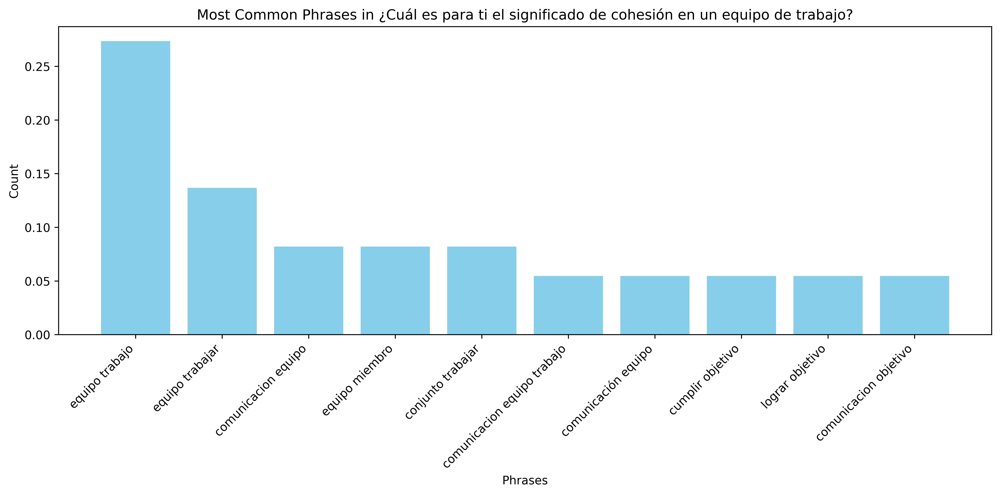

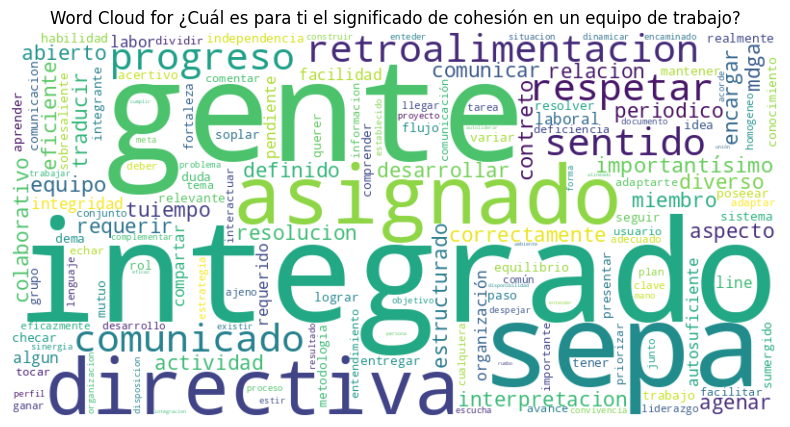

Most important 1-word combinations for ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?: ["( ' que ' , ) 70", "( ' el ' , ) 68", "( ' él ' , ) 43"]
Most important 2-word combinations for ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?: ["' equipo ' ) ( ' en ' , 14", "' tener ' ) ( ' que ' , 12", "' él ' ) ( ' que ' , 16"]
Most important 3-word combinations for ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?: ["' en ' , ' equipo ' ) ( ' trabajo ' , 8", "' equipo ' , ' que ' ) ( ' en ' , 7", "' en ' , ' equipo ' ) ( ' trabajar ' , 5"]


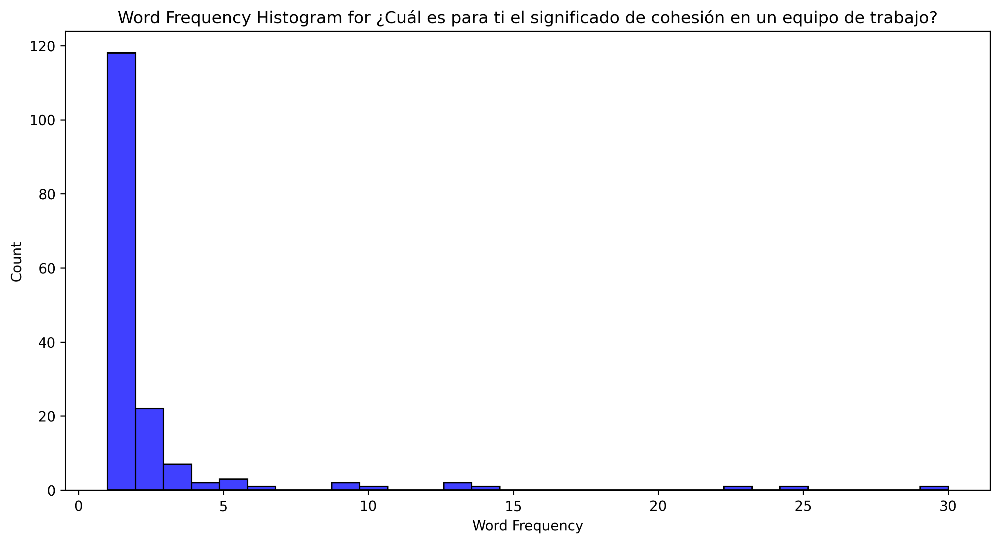

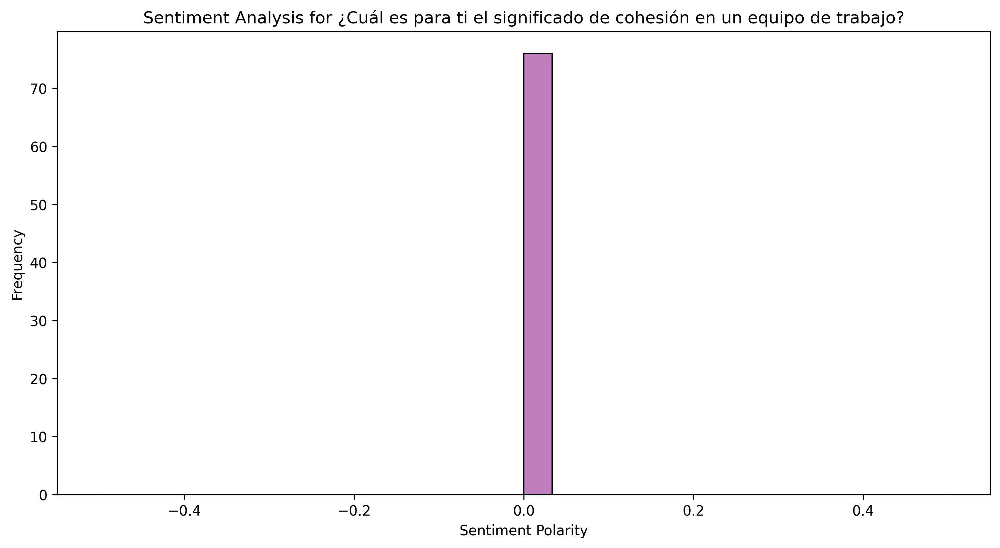

Not enough samples or features for word embedding in ¿Cuál es para ti el significado de cohesión en un equipo de trabajo?


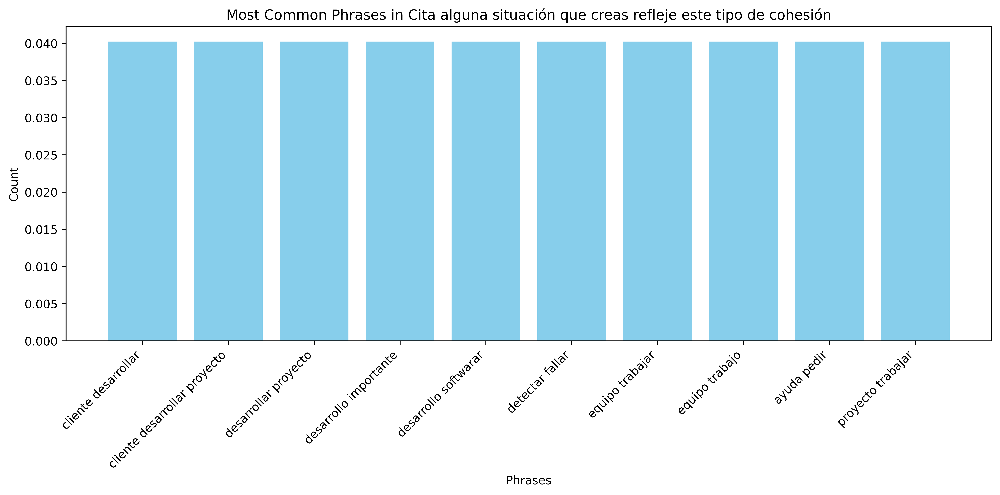

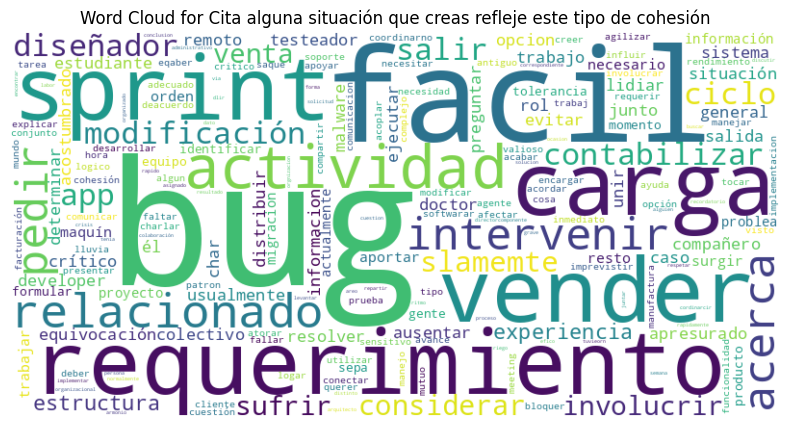

Most important 1-word combinations for Cita alguna situación que creas refleje este tipo de cohesión: ["( ' el ' , ) 126", "( ' él ' , ) 89", "( ' de ' , ) 82"]
Most important 2-word combinations for Cita alguna situación que creas refleje este tipo de cohesión: ["' el ' ) ( ' en ' , 21", "' uno ' ) ( ' en ' , 12", "' que ' ) ( ' tener ' , 11"]
Most important 3-word combinations for Cita alguna situación que creas refleje este tipo de cohesión: ["' que ' , ' él ' ) ( ' él ' , 3", "' el ' , ' que ' ) ( ' en ' , 4", "' que ' ) ' tener ' , ( ' él ' , 3"]


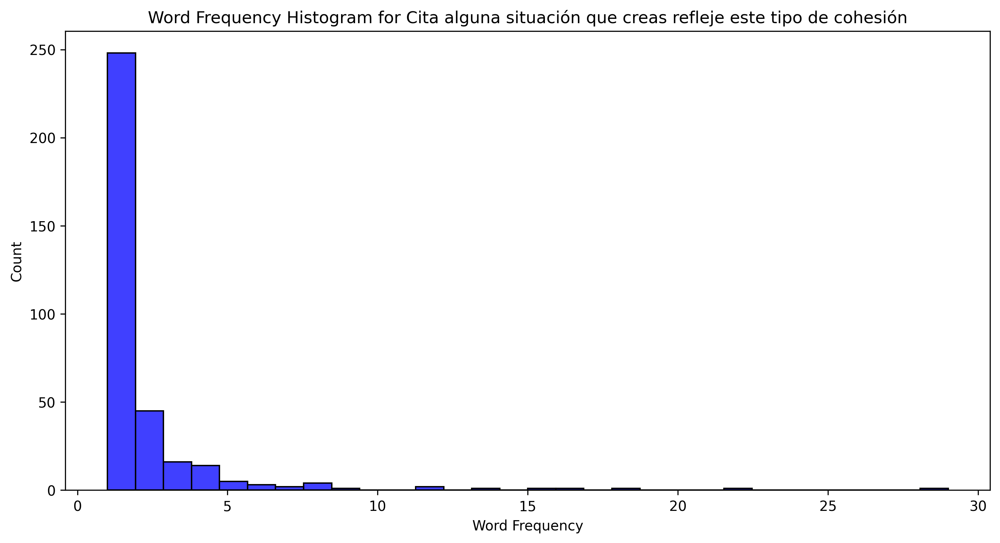

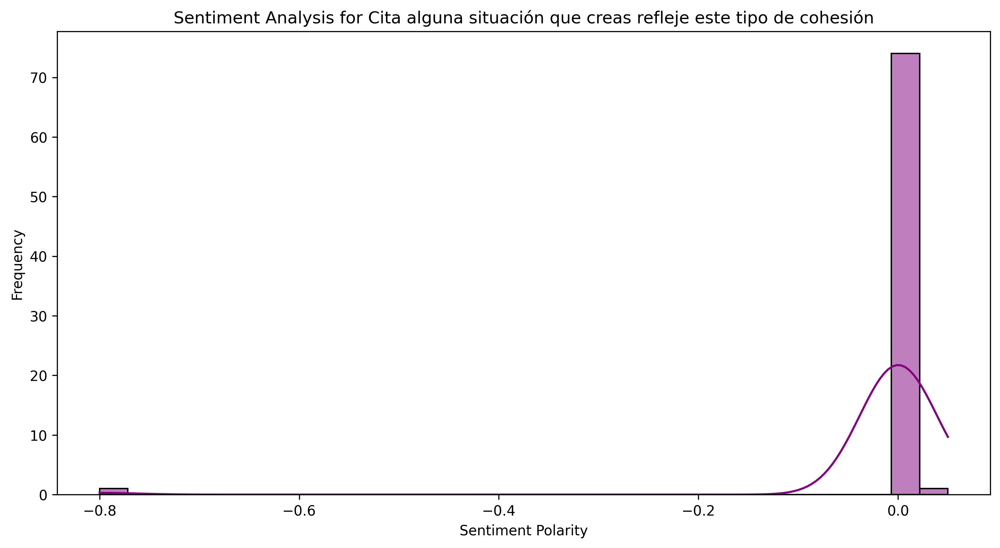

Not enough samples or features for word embedding in Cita alguna situación que creas refleje este tipo de cohesión


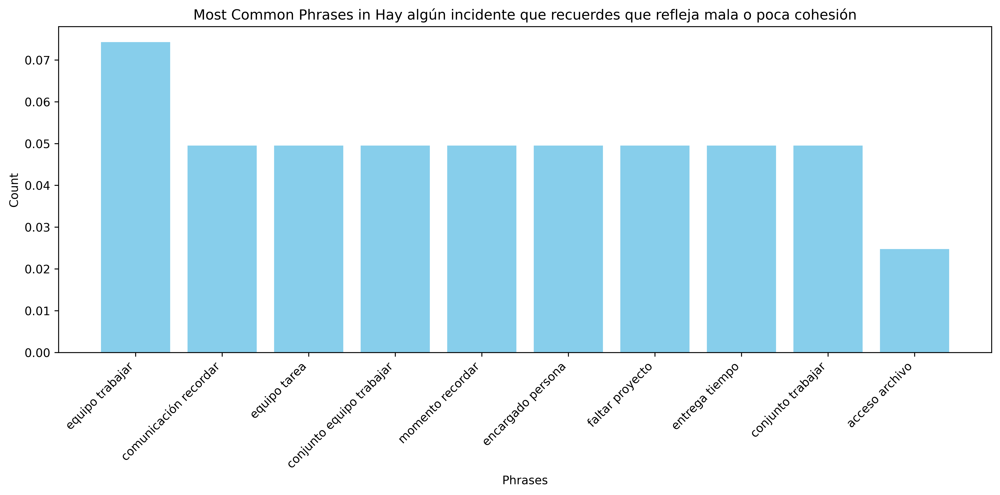

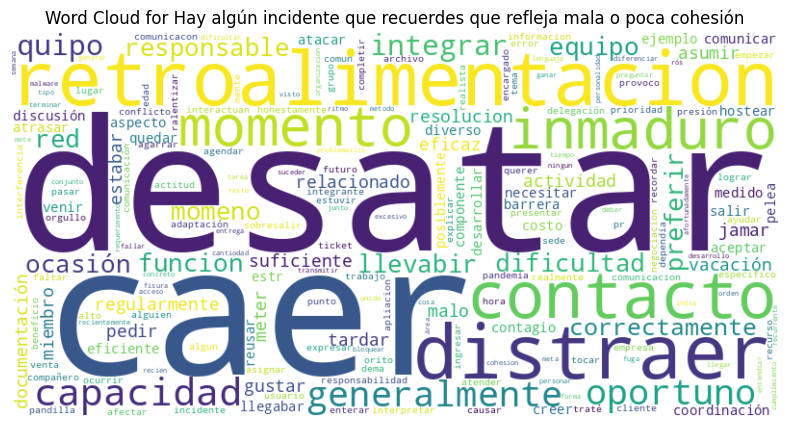

Most important 1-word combinations for Hay algún incidente que recuerdes que refleja mala o poca cohesión: ["( ' no ' , ) 64", "( ' él ' , ) 52", "( ' el ' , ) 82"]
Most important 2-word combinations for Hay algún incidente que recuerdes que refleja mala o poca cohesión: ["' de ' ) ( ' falta ' , 14", "' el ' ) ( ' en ' , 17", "' él ' ) ( ' no ' , 16"]
Most important 3-word combinations for Hay algún incidente que recuerdes que refleja mala o poca cohesión: ["' de ' ) ' falta ' , ( ' por ' , 5", "' de ' ) ' falta ' , ( ' el ' , 7", "' comunicacion ' ) ' de ' , ( ' falta ' , 8"]


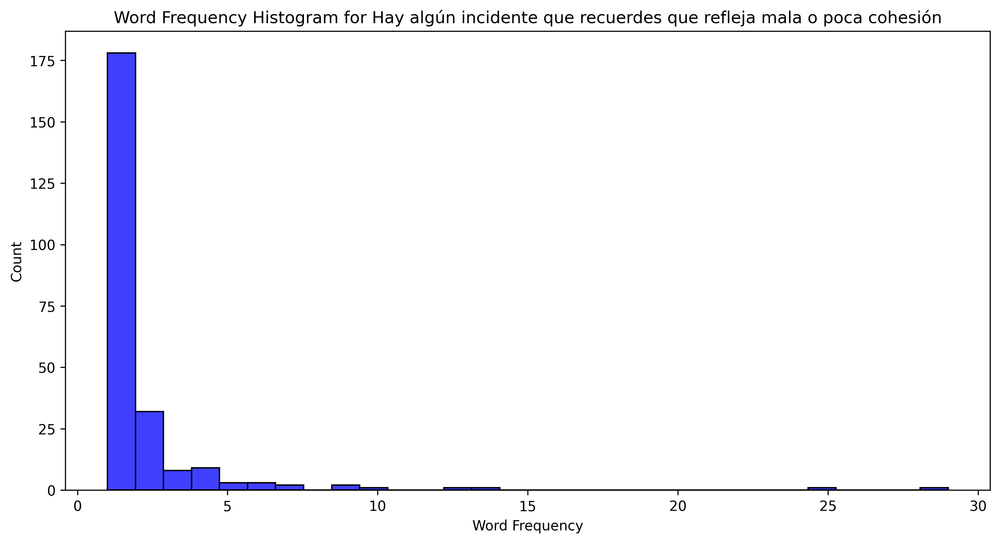

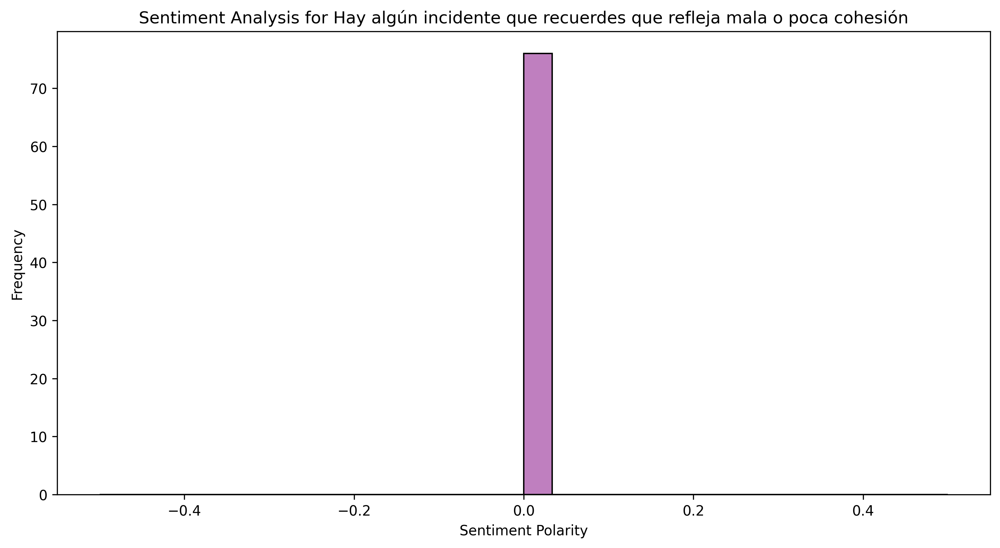

Not enough samples or features for word embedding in Hay algún incidente que recuerdes que refleja mala o poca cohesión


In [60]:
column_names = df.columns[-3:].tolist()
nlp_analysis = NLPAnalysis(df, column_names, remove_sentiment_stop_words=False)
nlp_analysis.run()

In [61]:
import pandas as pd
import docx
import re

# Function to read text from a .docx file
def read_docx(file_path):
    doc = docx.Document(file_path)
    full_text = []
    for para in doc.paragraphs:
        full_text.append(para.text)
    return '\n'.join(full_text)

# Function to convert experience text to number of years
def convert_experience_to_years(experience_text):
    if 'año' in experience_text:
        years = re.search(r'(\d+)\s*año', experience_text)
        if years:
            return int(years.group(1))
    if 'mes' in experience_text:
        months = re.search(r'(\d+)\s*mes', experience_text)
        if months:
            return round(int(months.group(1)) / 12, 2)
    return 'N/A'

# Read the text from the .docx file
file_path = '/Users/mi19292/Documents/SERVICIO_SOCIAL/respuestas_d.docx'
text = read_docx(file_path)

# Split the text into lines
lines = text.strip().split('\n')

# Initialize lists to store the data
profesionistas = []
experiencias = []
factores = []

# Iterate over the lines and extract the data
i = 0
while i < len(lines):
    if lines[i].startswith("Profesionista"):
        profesionistas.append(lines[i].split(':')[0].strip())
        experiencia_text = lines[i].split(':')[1].strip()
        experiencias.append(convert_experience_to_years(experiencia_text))
        factor = []
        i += 1
        while i < len(lines) and not lines[i].startswith("Profesionista"):
            factor.append(lines[i].strip())
            i += 1
        factores.append(' '.join(factor))
    else:
        i += 1

# Create a DataFrame from the lists
df = pd.DataFrame({
    'Profesionista': profesionistas,
    'Experiencia (años)': experiencias,
    'Factores': factores
})

# Save the DataFrame to a CSV file
df.to_csv('output.csv', index=False)

In [62]:
df

,Profesionista,Experiencia (años),Factores
0,Profesionista 1,2,Los factores que considero pueden ser la comun...
1,Profesionista 2,3,"Creo que sería de nuevo la comunicación, la co..."
2,Profesionista 3,5,"Buena comunicación, tener siempre mente abiert..."
3,Profesionista 4,3,"Organización, responsabilidad por parte de tod..."
4,Profesionista 5,N/A,"Comunicación, también organizar los horarios b..."
...,...,...,...
56,Profesionista 57,0.17,Pues yo pienso que lo más importante es litera...
57,Profesionista 58,6,"Primeramente, el tiempo fuera de trabajos debe..."
58,Profesionista 59,3,Pues creo que sería buena comunicación y un bu...
59,Profesionista 60,6,"Principalmente yo creo que comunicación, la me..."


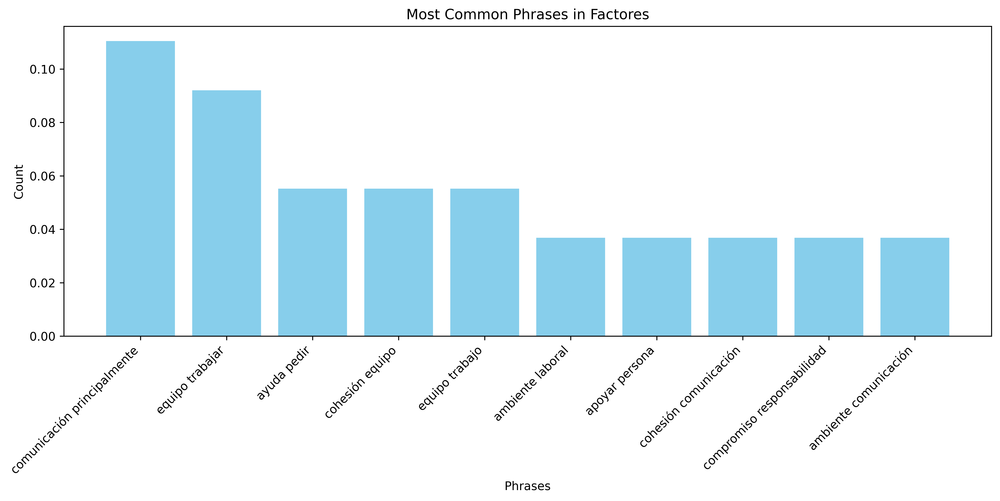

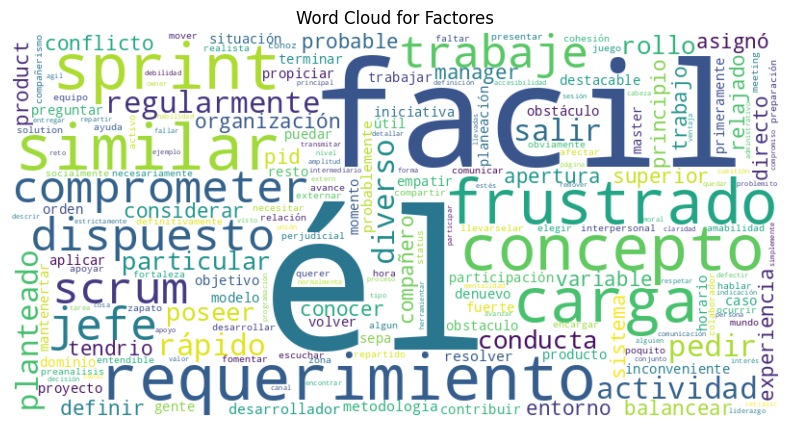

Most important 1-word combinations for Factores: ["( ' trabajo ' , ) 23", "( ' comunicación ' , ) 39", "( ' equipo ' , ) 36"]
Most important 2-word combinations for Factores: ["' importante ' ) ( ' comunicación ' , 4", "' equipo ' ) ( ' trabajar ' , 5", "' comunicación ' ) ( ' principalmente ' , 6"]
Most important 3-word combinations for Factores: ["' comunicación ' ) ' equipo ' , ( ' trabajar ' , 2", "' comunicación ' ) ' considerar ' , ( ' factor ' , 1", "' comunicación ' , ' energía ' ) ( ' considerar ' , 1"]


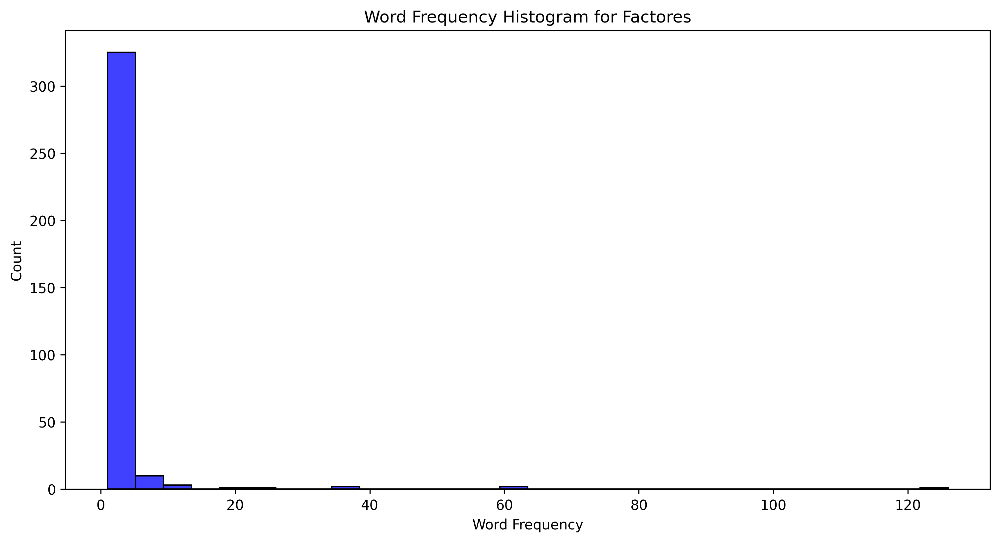

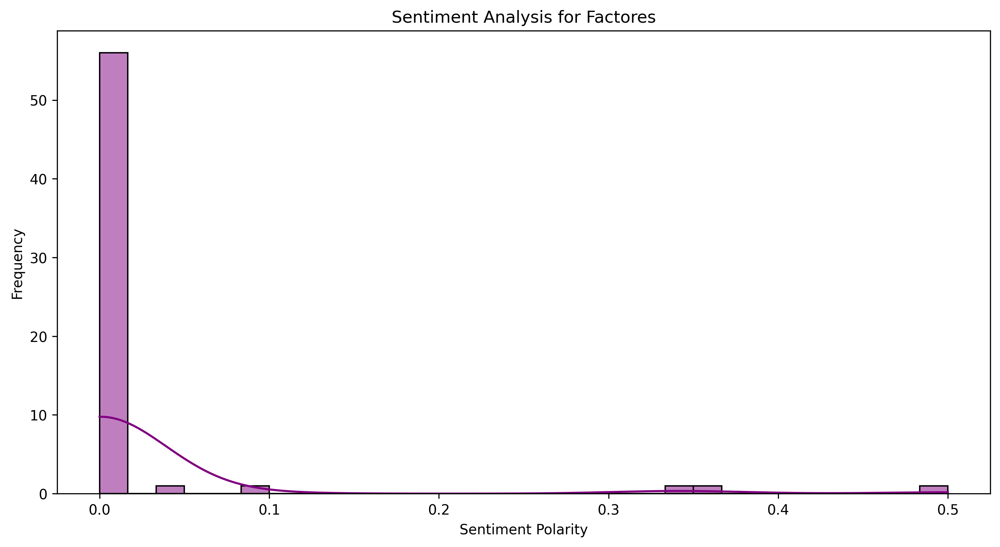

Not enough samples or features for word embedding in Factores


In [63]:
column_names = ['Factores']
nlp_analysis = NLPAnalysis(df, column_names)
nlp_analysis.run()

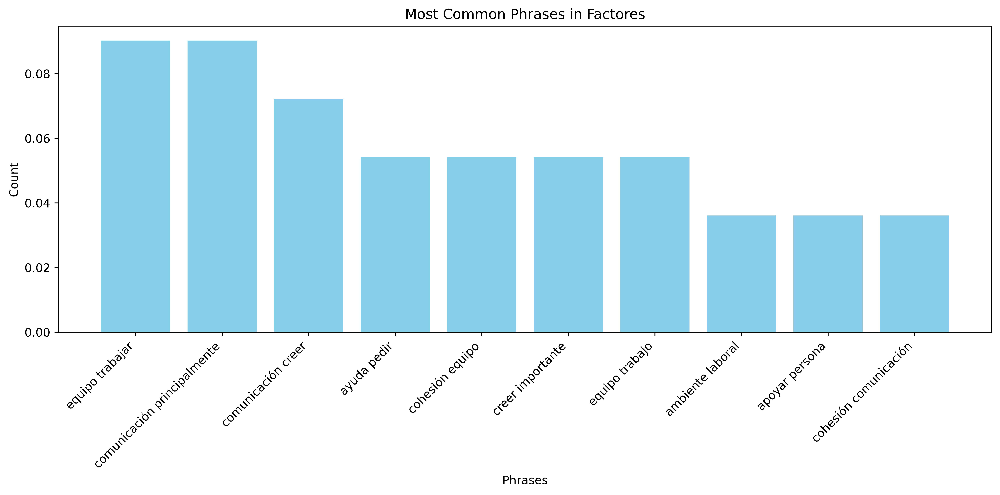

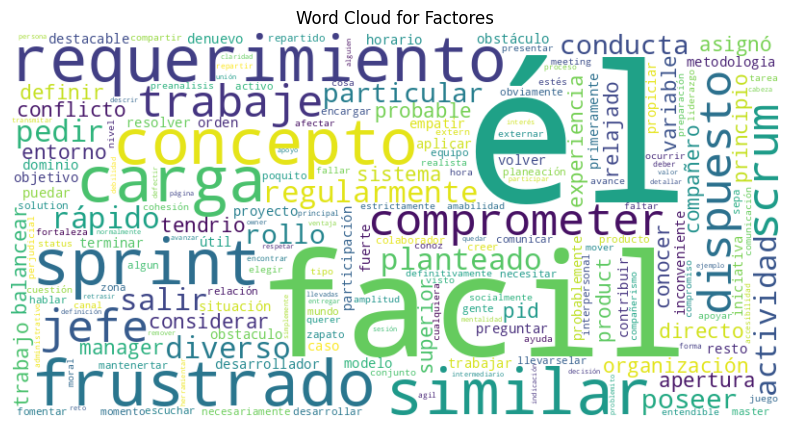

Most important 1-word combinations for Factores: ["( ' que ' , ) 155", "( ' de ' , ) 106", "( ' el ' , ) 183"]
Most important 2-word combinations for Factores: ["' el ' ) ( ' en ' , 17", "' el ' ) ( ' de ' , 18", "' él ' ) ( ' que ' , 27"]
Most important 3-word combinations for Factores: ["' que ' , ' ser ' ) ( ' creer ' , 5", "' nada ' ) ' que ' , ( ' más ' , 5", "' creer ' , ' que ' ) ( ' yo ' , 9"]


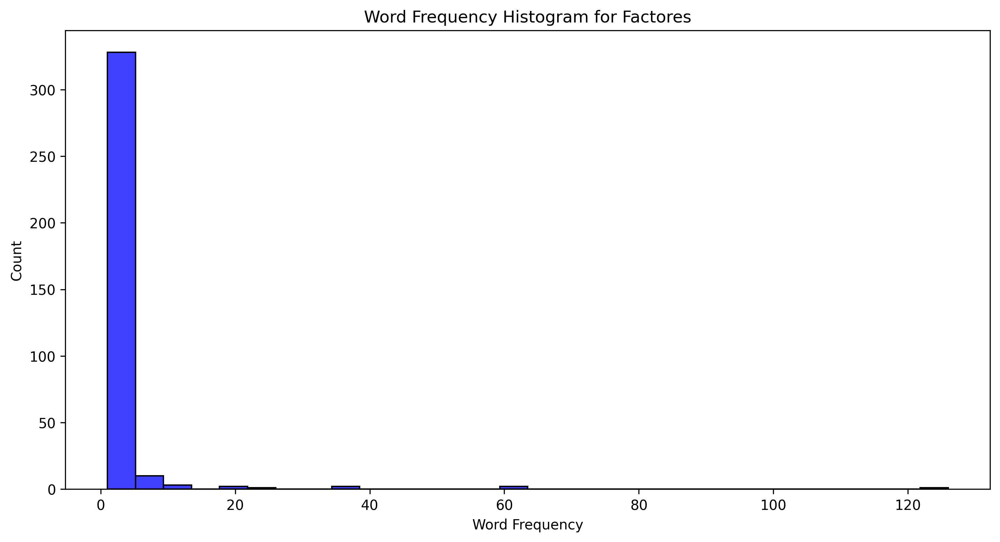

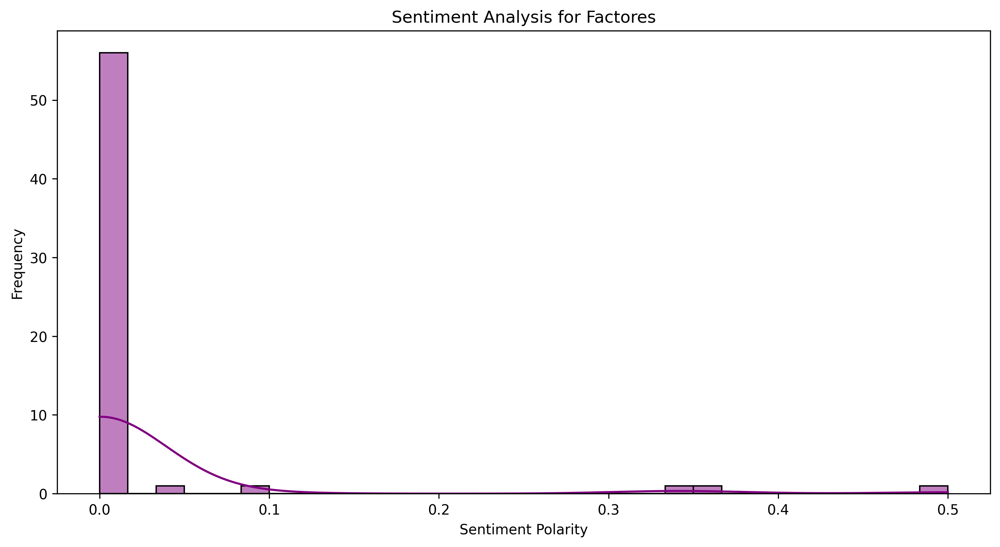

Not enough samples or features for word embedding in Factores


In [64]:
column_names = ['Factores']
nlp_analysis = NLPAnalysis(df, column_names, remove_sentiment_stop_words=False)
nlp_analysis.run()